<a href="https://colab.research.google.com/github/aalr007/VisionComputacional/blob/main/Copia_de_1_basic_operations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)

#**Maestría en Inteligencia Artificial Aplicada**
##**Curso: Visión computacional para imágenes y video**
###Tecnológico de Monterrey
###Prof Dr. Gilberto Ochoa Ruiz

## **Adtividad de la Semana 2**
###**2.2 Google Colab - Simple_ImgProcessing**

* Jessica Lechuga Ramos   A01793512
* Héctor Manuel González Villareal  A00178679
* Alberto Nieves Cisneros A01793829
* Luis Alfredo Negron Naldos A01793865
* Aurelio Antonio Lozano Rábago A01081266

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import cv2 as cv
from skimage import io

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


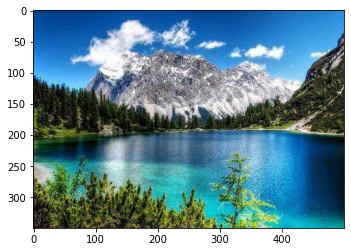

In [ ]:
img1 = mpimg.imread('data/image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [ ]:
img1.shape

(350, 500, 3)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

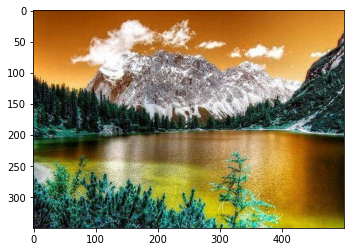

In [ ]:
img2 = cv2.imread('data/image.jpg')
plt.imshow(img2)


The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB). 

Let's fix that

AxesImage(54,36;334.8x217.44)


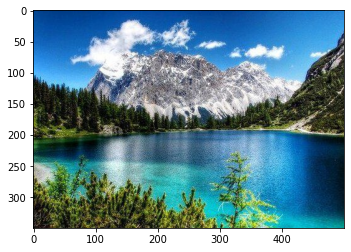

In [ ]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


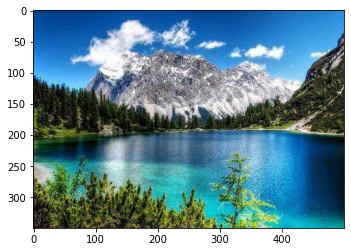

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('data/image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [ ]:
img3 = np.array(img3)
img3.shape

(350, 500, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

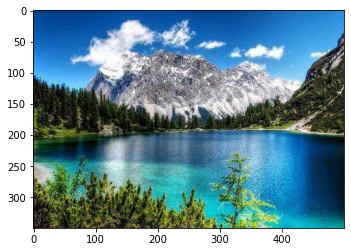

In [ ]:
# Save the image
np.save('data/img.npy', img3)

# Load the image
img3 = np.load('data/img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it. 

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 500 x 350
New size: 200 x 200


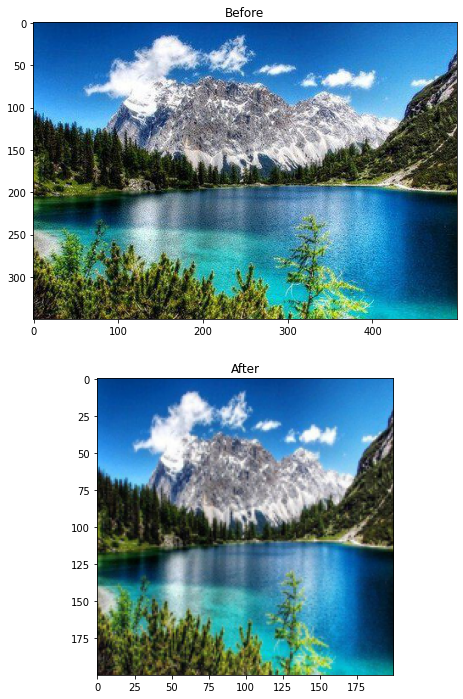

In [ ]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 500 x 350
Scaled size: 200 x 140
New size: 200 x 200


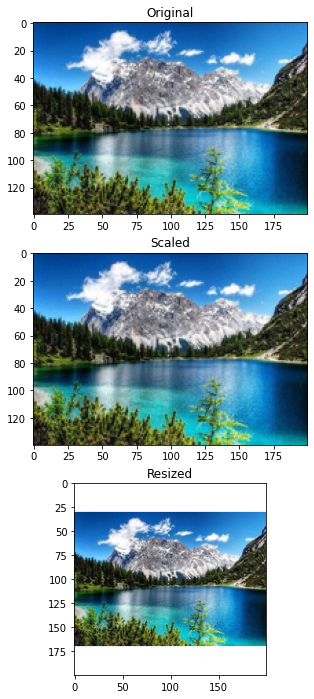

In [ ]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.ANTIALIAS)
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

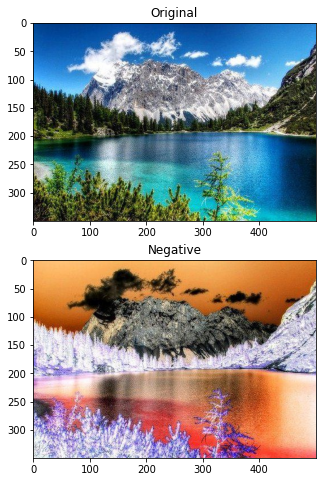

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
c = 255 / np.log(1 + np.max(orig_img))
log_img = c * (np.log(orig_img + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)

<ipython-input-191-df301d760c24>:6: RuntimeWarning: divide by zero encountered in log
  log_img = c * (np.log(orig_img + 1))


Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

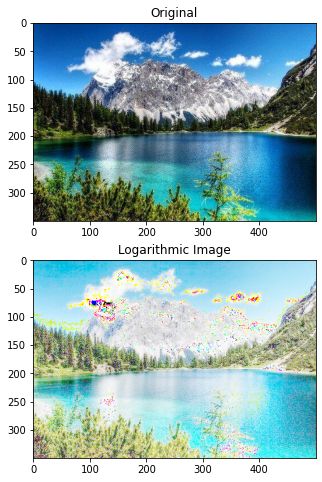

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

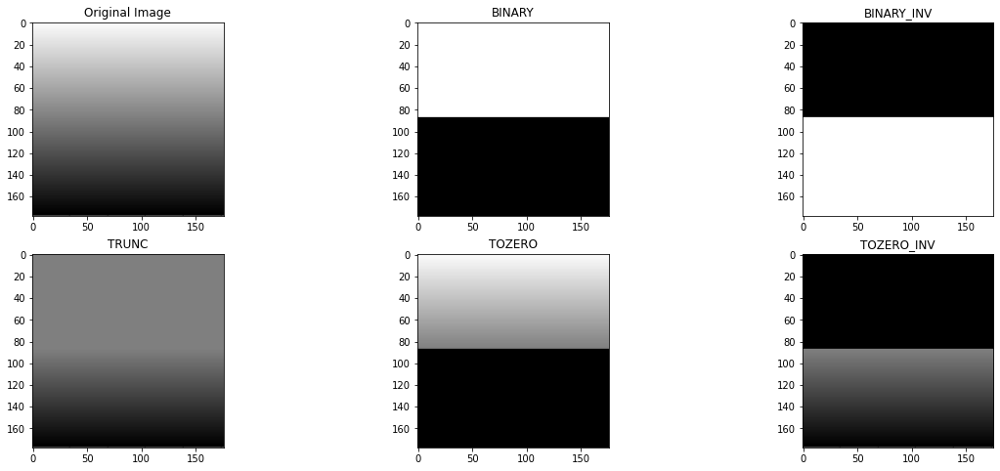

In [ ]:
orig_img = cv2.imread('data/linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)
 
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

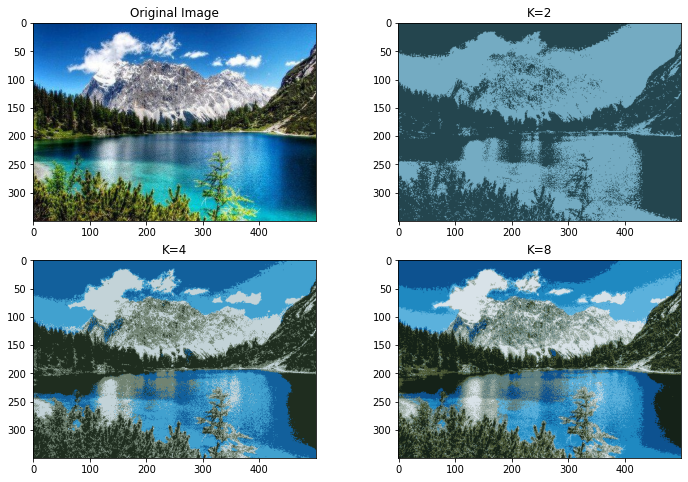

In [ ]:
orig_img = cv2.imread('data/image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
   
   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

#1
Las transformaciones pixel a pixel son sumamente utilizadas para aumentar la cantidad de imágenes para entrenar modelos de inteligencia artificial, sobre todo aquellas de tipo fotométrico. Investiga 3 tipos de transformaciones y aplicarlas en el proyecto de Google Collab sobre imágenes propias.

¿Que es el pixel-wise processing? Operaciones como 🡪

*   Brillo/contraste

* Cuantización

* Imágenes negativas

* Thresholding - binarización

* Bit plane slicing

* Procesamiento usando combinaciones de varios de estos métodos






Brillo y Contraste

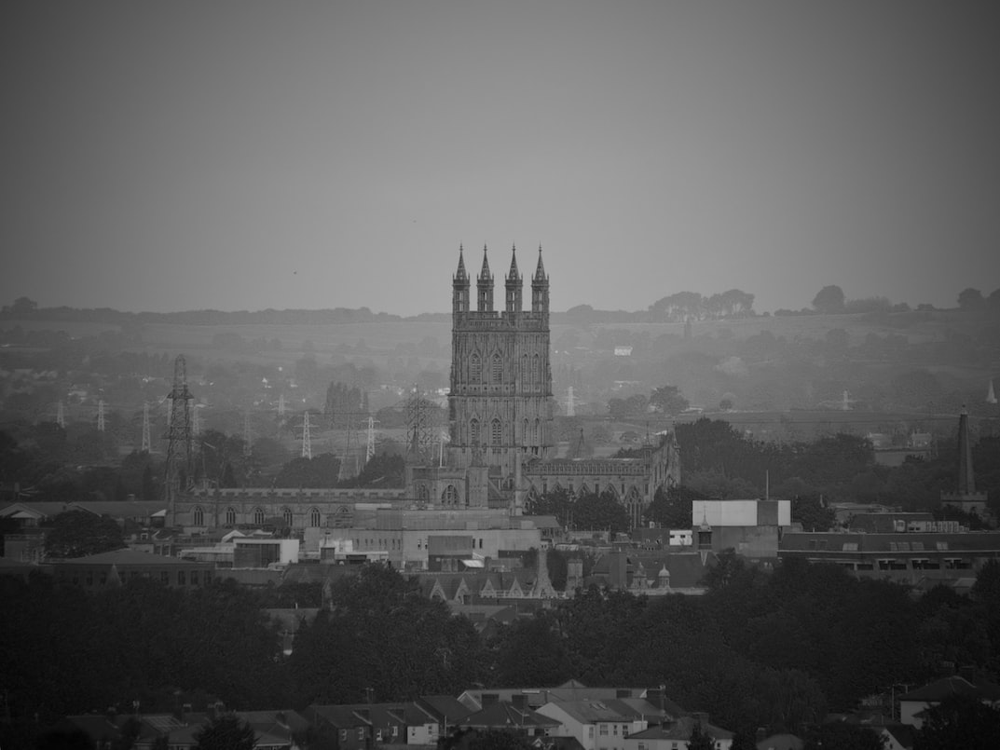

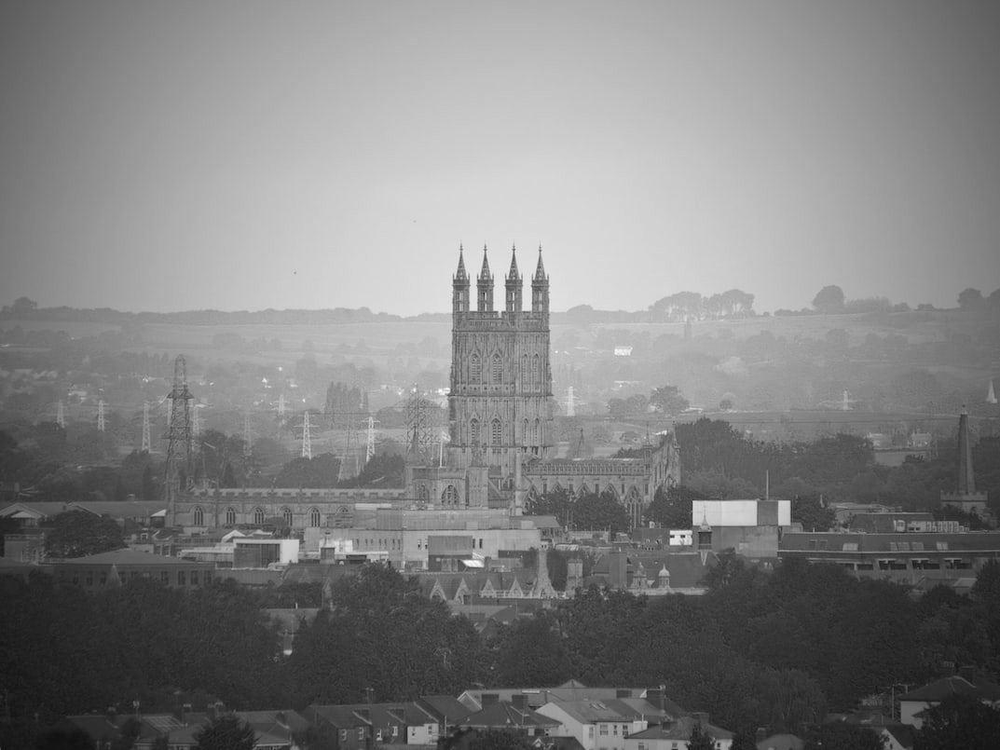

In [ ]:
#CONTRAST AND BRIGHT TRANSFORMATION
from skimage import io
from google.colab.patches import cv2_imshow # for image display

url = "https://images.unsplash.com/photo-1569722177871-4ed8080b7151?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1073&q=80"
E1_1Img = io.imread(url)
E1_1GrayImg = cv.cvtColor(E1_1Img, cv.COLOR_BGR2GRAY)
cv2_imshow(E1_1GrayImg)


# define the alpha and beta
alpha = 1.25 # Contrast control 
beta = 14 # Brightness control

# call convertScaleAbs function
adjusted = cv2.convertScaleAbs(E1_1GrayImg, alpha=alpha, beta=beta)

# display the output image
cv2_imshow(adjusted)

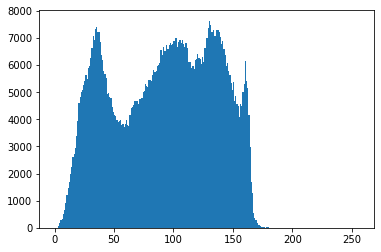

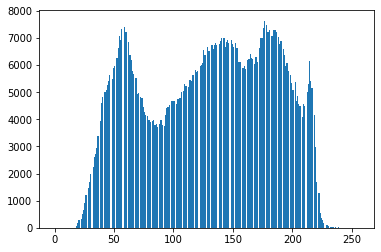

In [ ]:
plt.hist(E1_1GrayImg.ravel(),bins = 256, range = [0, 256])
plt.show()
plt.hist(adjusted.ravel(),bins = 256, range = [0, 256])
plt.show()

Thresholding

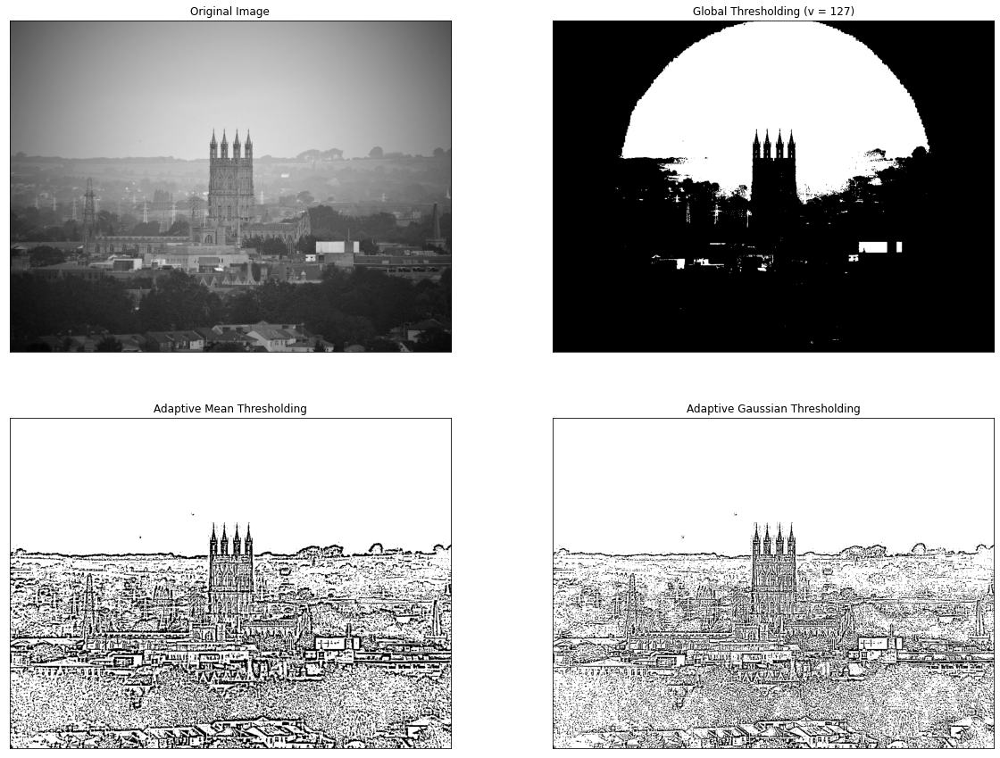

In [ ]:
from matplotlib import pyplot as plt

#img = cv.medianBlur(img,5)
ret,th1 = cv.threshold(E1_1GrayImg,127,255,cv.THRESH_BINARY)

th2 = cv.adaptiveThreshold(E1_1GrayImg,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)

th3 = cv.adaptiveThreshold(E1_1GrayImg,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [E1_1GrayImg, th1, th2, th3]

#original plot size was too small, following code is to have a bigger image
f = plt.figure()
f.set_figwidth(20)
f.set_figheight(15)

for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

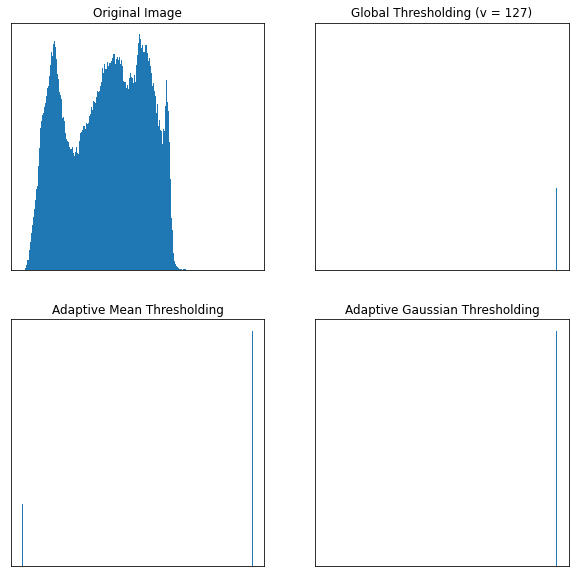

In [ ]:
#cv2_imshow(images[3])
i=0
f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)

for i in range(4):
  plt.subplot(2,2,i+1),plt.hist(images[i].ravel(),bins = 256, range = [0, 256])
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])

plt.show()

contrast stretching

contrast stretching via the cv2.normalize() method using min_max normalization

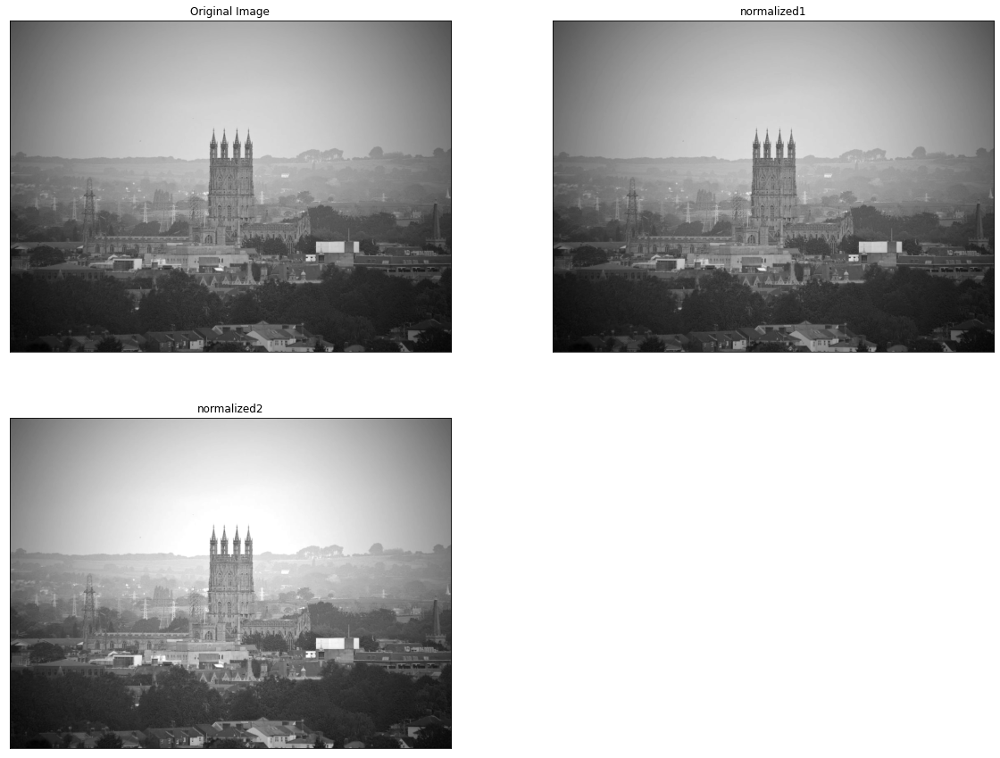

In [ ]:
# normalize float versions
norm_img1 = cv2.normalize(E1_1GrayImg, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
norm_img2 = cv2.normalize(E1_1GrayImg, None, alpha=0, beta=1.2, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

# scale to uint8
norm_img1 = (255*norm_img1).astype(np.uint8)
norm_img2 = np.clip(norm_img2, 0, 1)
norm_img2 = (255*norm_img2).astype(np.uint8)

# write normalized output images
cv2.imwrite("zelda1_bm20_cm20_normalize1.jpg",norm_img1)
cv2.imwrite("zelda1_bm20_cm20_normalize2.jpg",norm_img2)

titles = ['Original Image', 'normalized1',
            'normalized2']
images = [E1_1GrayImg, norm_img1, norm_img2]

#original plot size was too small, following code is to have a bigger image
f = plt.figure()
f.set_figwidth(20)
f.set_figheight(15)

for i in range(3):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()


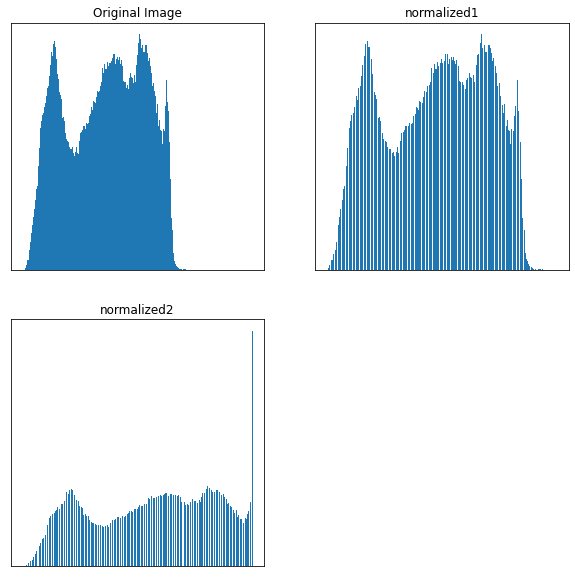

In [ ]:
i=0
f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)

for i in range(3):
  plt.subplot(2,2,i+1),plt.hist(images[i].ravel(),bins = 256, range = [0, 256])
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])

plt.show()

Brillo y contraste 2

(1252, 1200, 3)


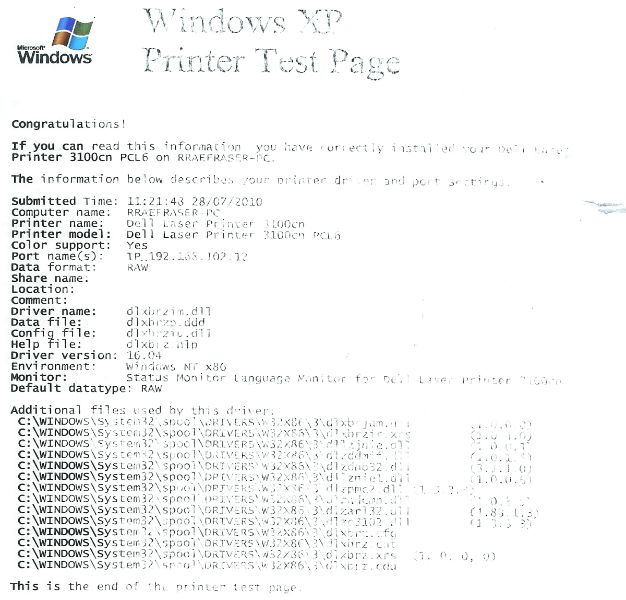

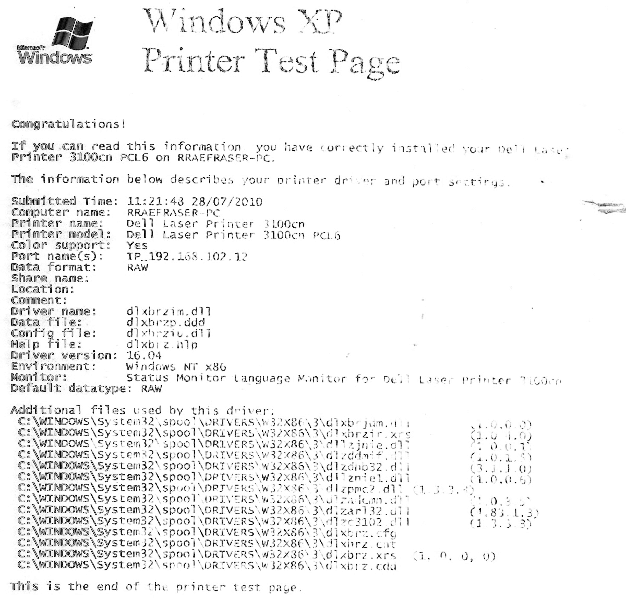

In [ ]:
url = "https://printsaverepeat.files.wordpress.com/2013/11/faded-ink.jpg?w=1200"

E1_1Img2 = io.imread(url)

dimensions = E1_1Img2.shape
print(dimensions)

imS2 = cv2.resize(E1_1Img2, (626, 600))
cv2_imshow(imS2)

E1_1GrayImg2 = cv.cvtColor(imS2, cv.COLOR_BGR2GRAY)


#CONTRAST AND BRIGHT TRANSFORMATION
# import the required library

# define the alpha and beta
alpha = 2 # Contrast control 
beta = -255 # Brightness control

# call convertScaleAbs function
adjusted = cv2.convertScaleAbs(E1_1GrayImg2, alpha=alpha, beta=beta)

# display the output image
cv2_imshow(adjusted)

#2

2 Investiga una aplicación donde obtener el negativo de imagen tenga un valor específico e integra el código en en una fila de google collab, justificar brevemente tu investigación y haciendo una demo sencilla.

El negativo de una imagen puede ser útil para analizar información de manera que pueda ser mas comprensible a pesar que el contenido visual sea el mismo que la imagen original. 

Esta transformación se puede lograr invirtiendo los niveles de intensidad de una imagen, mediante la funcion:

* s=L-1-r

Agunas de las aplicaciones comunes:

* entorno médico: al invertir radiografías para presentarlas como impresion en papel (fondo blanco con contenido en negro)

* Cosmografía: dar enfoque en obscuro a los objetos fotografíados al invertir el espacio negro en blanco y los objetos brillantes en obscuros

* Industria electronica: analizar fallos en los circuitos impresos 

En la siguiente imagen (radiografia de pecho) se realiza una transformación al negativo, para poder apreciar de manera mas natural el sistema circulatorio dentro de los pulmones.

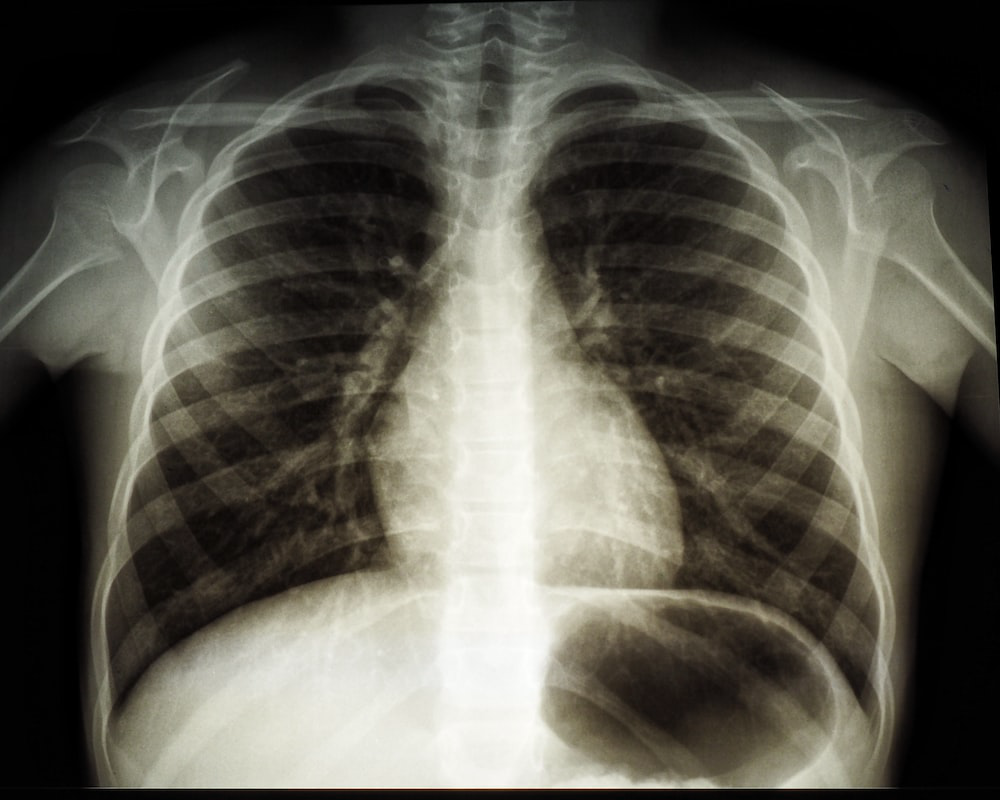

In [ ]:
url = "https://images.unsplash.com/photo-1616012480717-fd9867059ca0?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8Mnx8eCUyMHJheXxlbnwwfHwwfHw%3D&w=1000&q=80"

E2Img = io.imread(url)

cv2_imshow(E2Img)

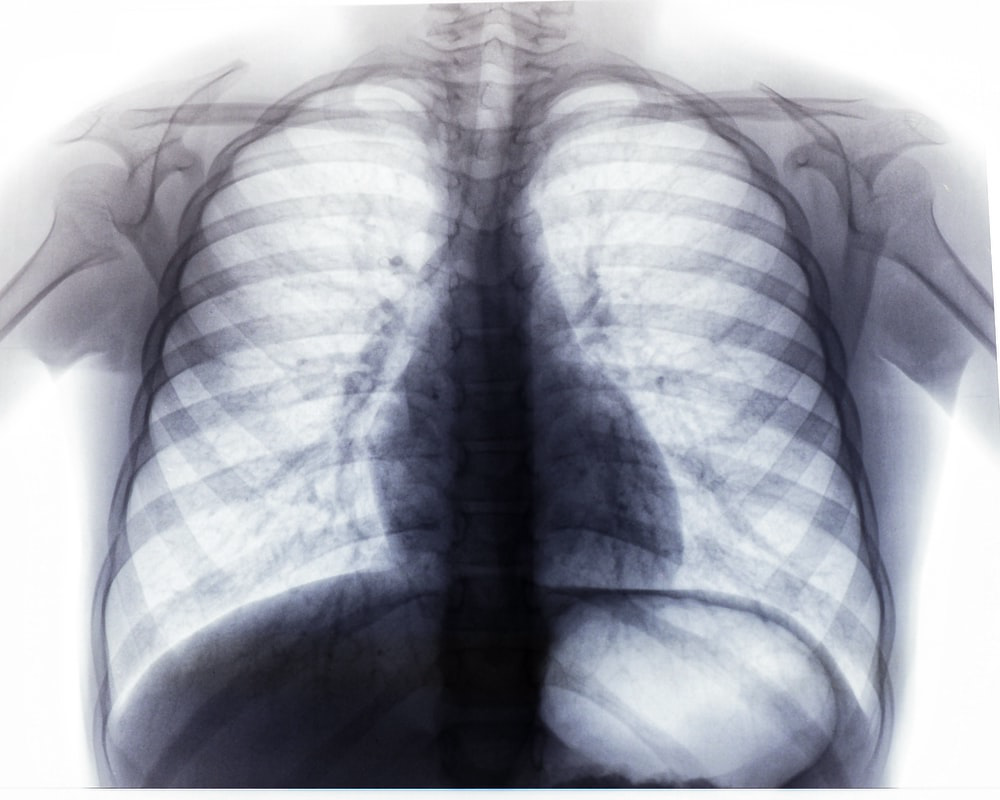

In [ ]:
colored_negative = abs(255-E2Img)
cv2_imshow(colored_negative)

#3
3 Investiga una aplicación donde se puede aplicar la corrección de gamma en una imagen. Integra el código en en una fila de google collab, justifica brevemente tu investigación y haz una demo sencilla.

Una transformación útil para imagenes que puedan ser muy obscuras o muy brillantes es la corrección Gamma, que es un método que permite controlar el brillo de la imagen.

la transformacion se da mediante la formula

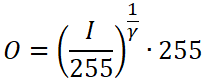


Gama correction formula

* I es el pixel de entrada en un rango de 8 bits
* O es el pixel de salida en rango de 8 bits
* y- gamma que controla el brillo de la imagen

si gama es menor a 1 entonces la imagen sera mas obscura.

Para gammas mayores a uno la imagen será mas brillante

gamma=1 no realiza cambios en la imagen

Corregir el brillo de las imagenes puede tener utilidad en imagenes espaciales, dependiendo del objeto a observar, se puede transformar la imagen, el siguiente código implementa la formula de Gamma en una imagen espacial

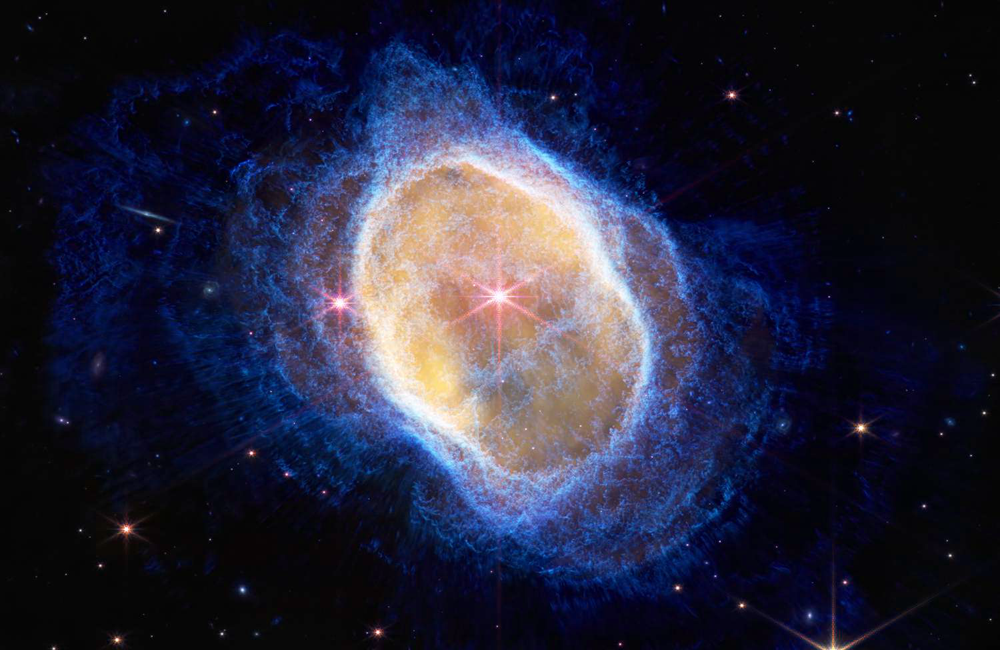

In [ ]:
#https://www.travelandleisure.com/thmb/sH4T0ElWwZFyUhtqAZD3USeiaSc=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/james-webb-hole-WEBB0722-a7b14258290d4da9be4c7d50ee732d9b.jpg
url = "https://www.travelandleisure.com/thmb/sH4T0ElWwZFyUhtqAZD3USeiaSc=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/james-webb-hole-WEBB0722-a7b14258290d4da9be4c7d50ee732d9b.jpg"

E3Img = io.imread(url)
cv2_imshow(E3Img)

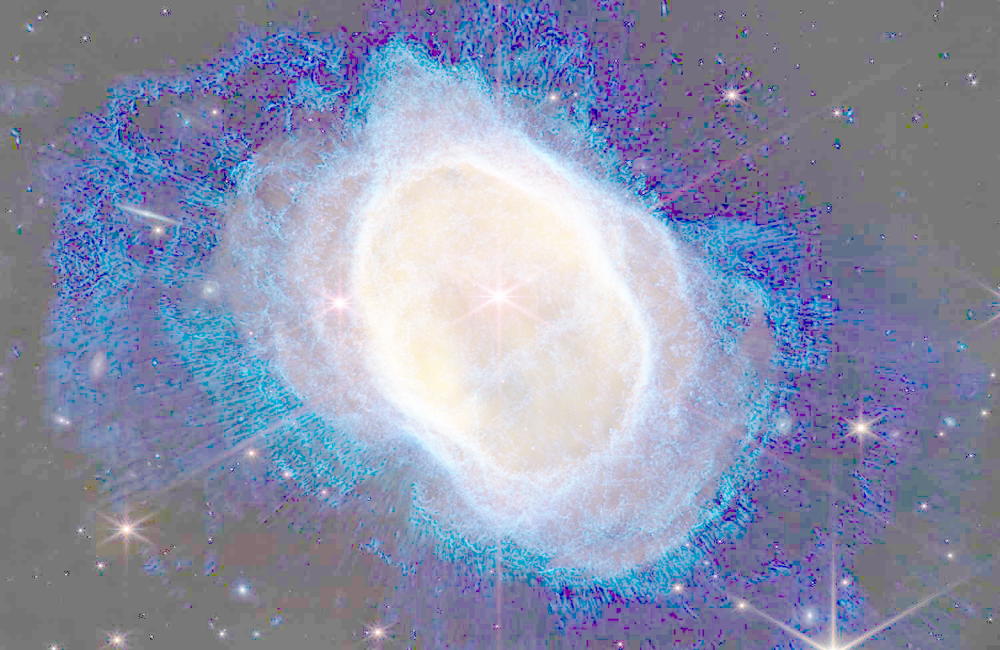

In [ ]:
def gammaCorrection(src, gamma):
    invGamma = 1 / gamma

    table = [((i / 255) ** invGamma) * 255 for i in range(256)]
    table = np.array(table, np.uint8)

    return cv2.LUT(src, table)



gammaImg = gammaCorrection(E3Img, 5)


cv2_imshow(gammaImg)

a continuacion se realiza un barrido en gamma para observar diferentes detalles de la imagen anterior, donde dependiendo el valor de Gamma, se aprecian diferentes detalles en la imagen.

0.1
<class 'float'>


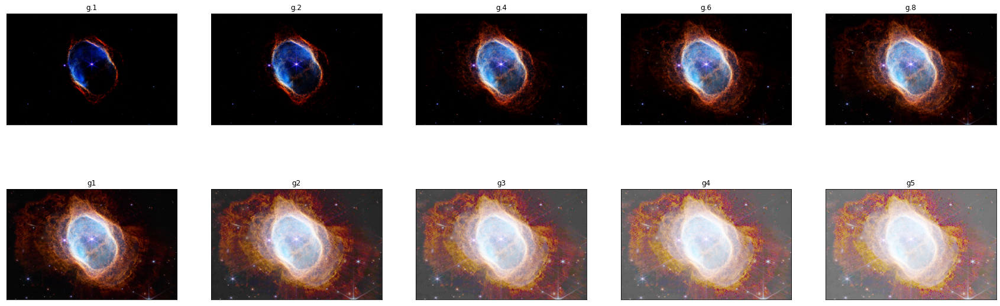

In [ ]:
titles = ['g.1', 'g.2','g.4','g.6','g.8','g1','g2','g3','g4','g5']
GammaVal=[.1,.2,.4,.6,.8,1,2,3,4,5]
GammaImages=[]

print(GammaVal[0])
print(type(GammaVal[0]))

i=0
for i in range(10):
  GammaImages.append(gammaCorrection(E3Img,GammaVal[i]))


#original plot size was too small, following code is to have a bigger image
f = plt.figure()
f.set_figwidth(30)
f.set_figheight(10)
i=0
for i in range(10):
    plt.subplot(2,5,i+1),plt.imshow(GammaImages[i])
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

# 4
Investiga una aplicación donde se puede usar la sustracción de imágenes e integra el código en en una fila de google collab, justificar brevemente tu investigación, haciendo una demo sencilla.


La sustracción de imagenes es un método muy usado para detectar cambios en imagenes estáticas (por ejemplo en ensayos clinicos denominada Spect Cerebral, para localizar la descarga de una epilepsia focal). En otra aplicación documentada es para evaluar el estado actual y la aplicación clínica en la resonancia mágnetica de mamá, donde se comparan en la evaluación de los resultados de la resonancia la sustracción de imágenes con o sin contraste y en la reconstrucción de las imagenes de sustracción en planos ortogonales, (Herrero, 2011). 

Otra aplicación es para videos en detección de movimiento con camaras estáticas. (Gervasoni, D'amato, Barbuzza & Venere, 2014). En este último caso para detectar movimiento cada frame se compara con un modelo obtenido anteriormente y se identifica las zonas en movimiento vs las zonas estáticas. 



**CASO 1: Utilizando las imagenes normal y el umbral adaptativo para identificar las diferencias que resalta el cambio pixel a pixel desarrollado en el ejemplo anterior**

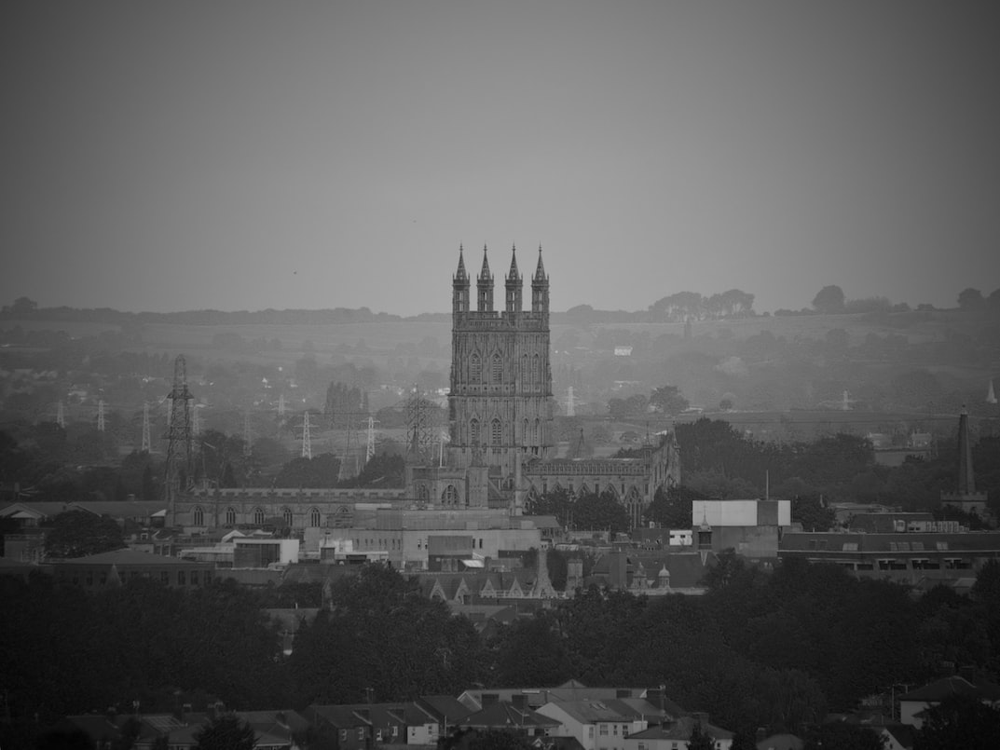

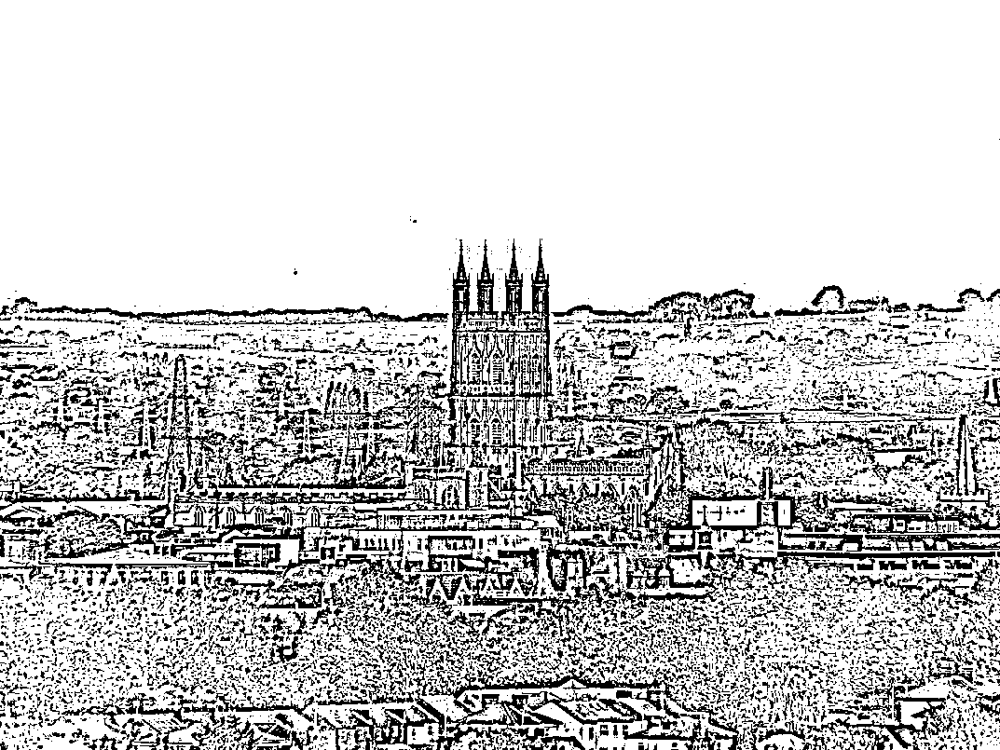

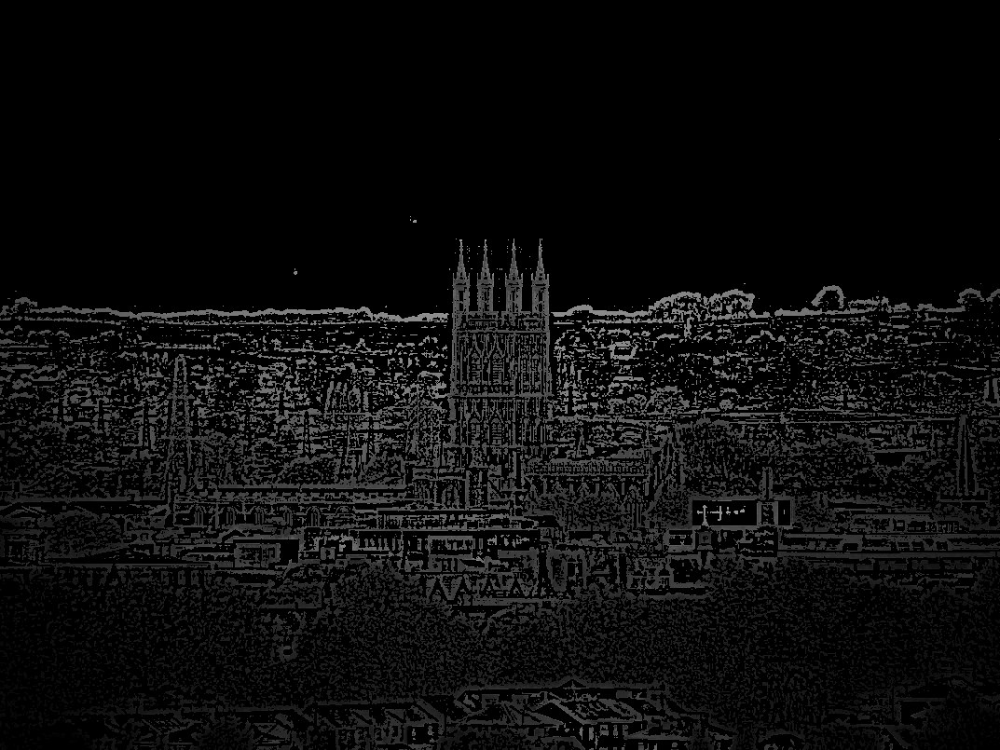

In [ ]:
from matplotlib import pyplot as plt
window_name = 'image'
#cv2_imshow(window_name, E1_1GrayImg)
cv2_imshow(E1_1GrayImg)
cv2_imshow(th2)
img_sub = cv2.subtract(E1_1GrayImg,th2 )
cv2_imshow(img_sub)

**CASO 2: Utilizando las Arm (angiografía por resonancia magnética) del cerebro para pacientes con accidente cerebrovascular o detección de anomalías vasculares, mostrando arterias cerebrales y círculo de willis, concepto de imagen médica, con y sin contraste**

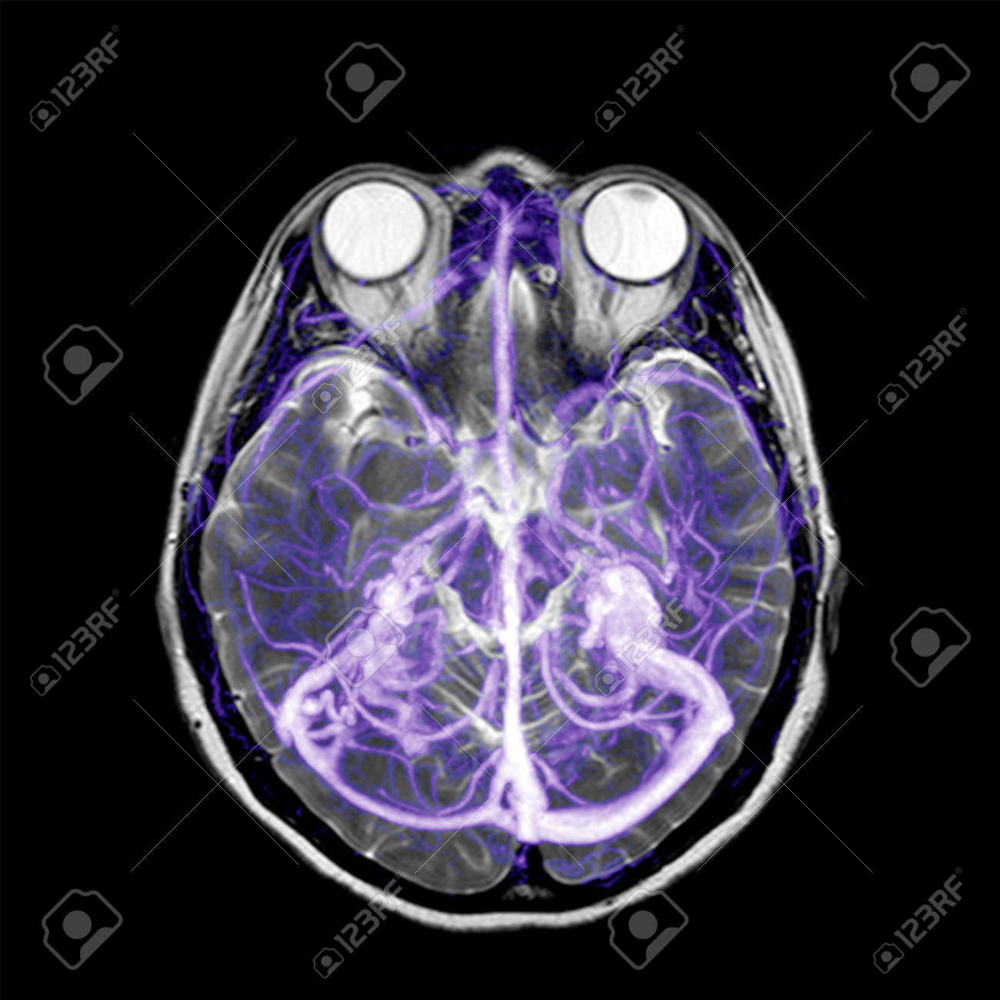

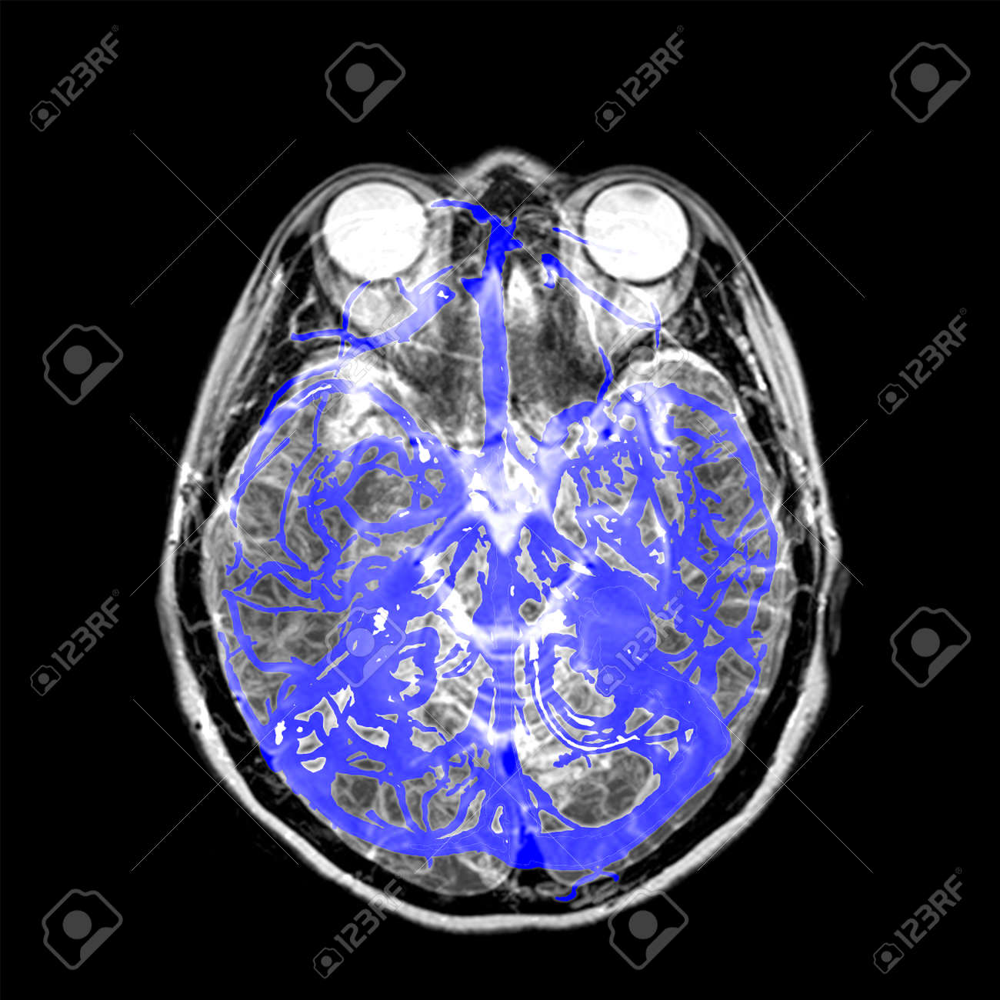

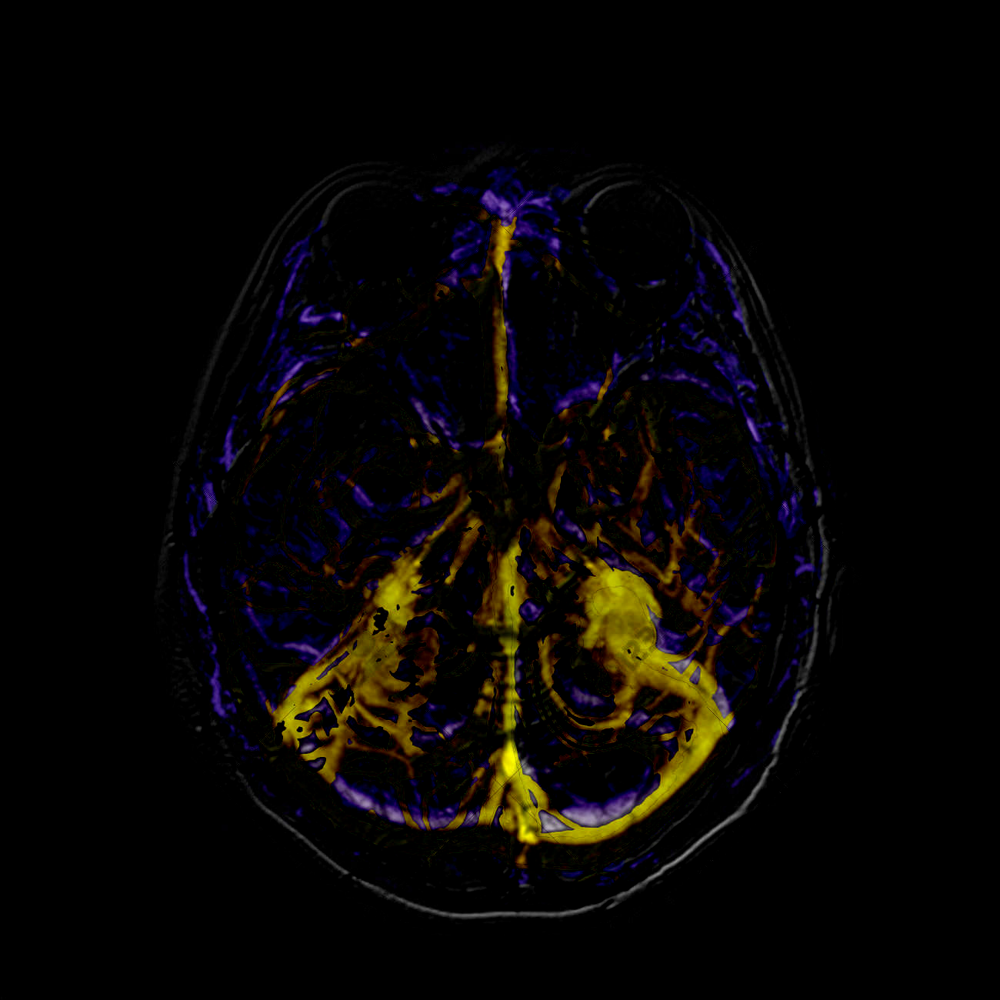

In [ ]:
# reading the images
url2 = "https://previews.123rf.com/images/tonporkasa/tonporkasa2102/tonporkasa210200031/163859022-arm-angiograf%C3%ADa-por-resonancia-magn%C3%A9tica-del-cerebro-para-pacientes-con-accidente-cerebrovascular-o-.jpg"
url3 = "https://previews.123rf.com/images/tonporkasa/tonporkasa2102/tonporkasa210200039/163859027-arm-angiograf%C3%ADa-por-resonancia-magn%C3%A9tica-del-cerebro-para-pacientes-con-accidente-cerebrovascular-o-.jpg"
sin_contraste = io.imread(url2)
con_contraste = io.imread(url3)
# subtract the images
subtracted = cv2.subtract(sin_contraste, con_contraste)
cv2_imshow(sin_contraste)
cv2_imshow(con_contraste)
cv2_imshow(subtracted)

#Bibliografía

* Capitulo 3. Digital Image Processing. R. Gonzalez & R. Woods. 4° Edition. Pearson.
* Apply Gamma Correction to an Image using OpenCV. Lindevs, July 24, 2021 (November 2, 2022) https://lindevs.com/apply-gamma-correction-to-an-image-using-opencv#:~:text=Gamma%20correction%20can%20be%20implemented,performs%20a%20lookup%20table%20transform.

* Gervasoni, G., D'amato, J. P., Barbuzza, R., & Vénere, M. (2014). Un método eficiente para la sustracción de fondo en vídeos usando gpu. Mecánica Computacional, 33(26), 1721-1731.

* Herrero, J. C. (2011). Resonancia magnética de mama: estado actual y aplicación clínica. Radiología, 53(1), 27-38.

*